# Utility Analysis Version 2

In [1]:
import pandas as pd 
import numpy as np
import seaborn as sns
import plotly.graph_objs as go
import plotly.express as px
import plotly.figure_factory as ff
import matplotlib.pyplot as plt

color_pal = sns.color_palette()

In [2]:
df = pd.read_excel("datasets/housemeterreadings.xlsx")
df = df.rename(columns={'index': 'houseid-meterid'})
df.head()

,id,paymenttermid,houseid,houseid-meterid,reading,month,year
0,1,37,241,241M990,753.56,2,2019
1,2,7,1,1M256,103.00,2,2019
2,3,7,5,5M260,103.00,2,2019
3,4,7,9,9M264,103.00,2,2019
4,5,7,13,13M268,107.00,2,2019


## Data Cleaning

In [3]:
mapping = {
        37: "electricity", 
        11:"backuppower", 
        36:"water", 
        7: "gas"}
df['paymenttermid'] = df['paymenttermid'].map(mapping)


In [4]:
df["Datetime"] = df["year"].astype(str) + '-' + df["month"].astype(str)
df["Datetime"] = pd.to_datetime(df["Datetime"])    

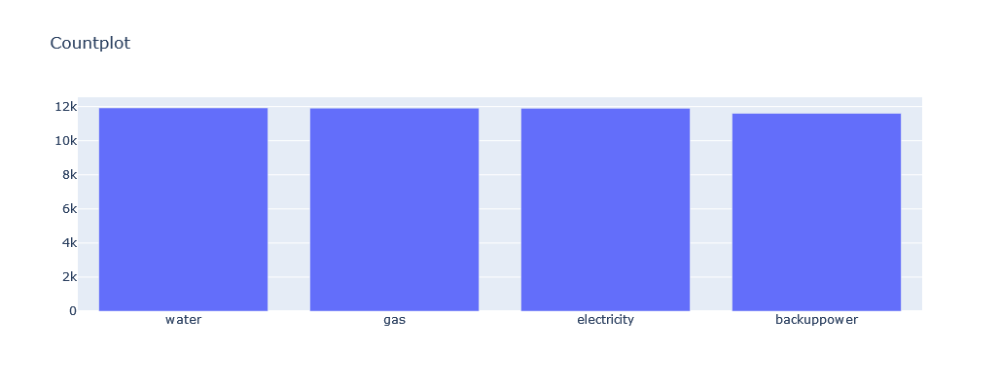

In [5]:
trace = go.Bar(x=df['paymenttermid'].value_counts().index, y=df['paymenttermid'].value_counts().values)
data = [trace]
layout = go.Layout(title='Countplot', width=600, height=400)
fig = go.Figure(data=data, layout=layout)
fig.show()

In [6]:
# test_2019 = data_2019.sort_values(by=["month","reading","houseid-meterid"])
# test_2019.head()
# test_2019["diff"] = test_2019.groupby(["month", "houseid-meterid"])["reading"].diff()
# test_2019["diff"] = test_2019["diff"].fillna(0)
# test_2019.head(10)
# test_2019['ranked'] = test_2019["diff"].rank(ascending=False)
# test_2019.sort_values(by='diff', ascending=False).tail()

In [7]:
data_2019 = df[df["year"] == 2019]
data_2020 = df[df["year"] == 2020]
data_2021 = df[df["year"] == 2021]
data_2022 = df[df["year"] == 2022]

In [8]:
grouped_data = data_2019.groupby(["month", "houseid-meterid", "paymenttermid"])
grouped_data.head()

def filter_func(x):
    return len(x) > 1

filtered = grouped_data.filter(filter_func)
filtered.head(21)

,id,paymenttermid,houseid,houseid-meterid,reading,month,year,Datetime
535,536,water,69,69M65,34.00,2,2019,2019-02-01
621,622,backuppower,192,192M690,0.07,2,2019,2019-02-01
1102,1103,backuppower,192,192M690,3.20,2,2019,2019-02-01
1103,1104,backuppower,192,192M690,3.20,2,2019,2019-02-01
1105,1106,water,69,69M65,171.00,2,2019,2019-02-01
1750,1751,water,69,69M65,37.00,3,2019,2019-03-01
1860,1861,water,69,69M65,240.00,3,2019,2019-03-01
6873,6874,water,141,141M133,77.00,9,2019,2019-09-01
6874,6875,electricity,141,141M898,968.33,9,2019,2019-09-01
6875,6876,gas,141,141M388,19492.00,9,2019,2019-09-01


In [9]:
def true_reading(x):
    if len(x) > 1:
        return x.max()
    else:
        return x
    
    
grouped_data = data_2019.groupby(["month", "houseid-meterid"])
data_2019["cleaned_readings"] = grouped_data["reading"].transform(true_reading)

In [10]:
data_2019 = data_2019[data_2019["reading"] == data_2019["cleaned_readings"]]

In [11]:
grouped_data = data_2020.groupby(["month", "houseid-meterid"])
data_2020["cleaned_readings"] = grouped_data["reading"].transform(true_reading)
data_2020 = data_2020[data_2020["cleaned_readings"] == data_2020["reading"]]

In [12]:
grouped_data = data_2021.groupby(["month", "houseid-meterid"])
data_2021["cleaned_readings"] = grouped_data["reading"].transform(true_reading)
data_2021 = data_2021[data_2021["cleaned_readings"] == data_2021["reading"]]

In [13]:
grouped_data = data_2022.groupby(["month", "houseid-meterid"])
data_2022["cleaned_readings"] = grouped_data["reading"].transform(true_reading)
data_2022 = data_2022[data_2022["cleaned_readings"] == data_2022["reading"]]

In [14]:
all_data = pd.concat([data_2019, data_2020, data_2021, data_2022])
all_data.set_index("Datetime", inplace=True)
all_data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 47307 entries, 2019-02-01 to 2022-12-01
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   id                47307 non-null  int64  
 1   paymenttermid     47307 non-null  object 
 2   houseid           47307 non-null  int64  
 3   houseid-meterid   47307 non-null  object 
 4   reading           47307 non-null  float64
 5   month             47307 non-null  int64  
 6   year              47307 non-null  int64  
 7   cleaned_readings  47307 non-null  float64
dtypes: float64(2), int64(4), object(2)
memory usage: 3.2+ MB


## Data Exploration

In [15]:
# all_data["consumption"] = all_data.groupby(["paymenttermid", "Datetime", "paymenttermid"])["cleaned_readings"].diff()
# all_data.info()
water_data = all_data[all_data["paymenttermid"] == "water"]
electricity_data = all_data[all_data["paymenttermid"] == "electricity"]
backuppower_data = all_data[all_data["paymenttermid"] == "backuppower"]
gas_data = all_data[all_data["paymenttermid"] == "gas"]


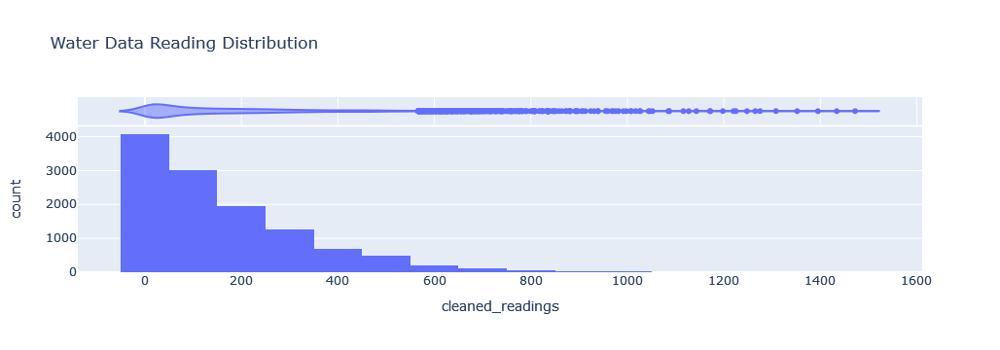

In [16]:
fig = px.histogram(water_data, 
                   x="cleaned_readings", 
                   marginal="violin", 
                   nbins=20, 
                   hover_data=["houseid-meterid"],
                   title="Water Data Reading Distribution"
                  )
fig.show()

In [17]:
q3 = water_data["cleaned_readings"].quantile(0.95)
print(f"The quantile value {q3}")

The quantile value 505.0


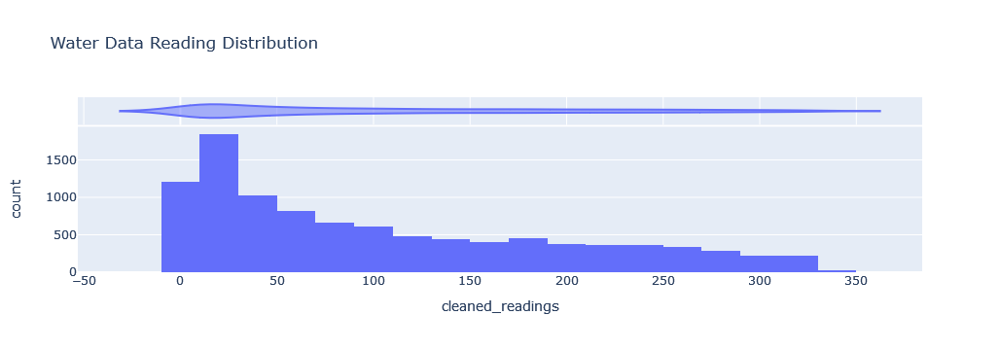

In [18]:
water_data = water_data[water_data["cleaned_readings"] < water_data["cleaned_readings"].quantile(0.85)]
fig = px.histogram(water_data, 
                   x="cleaned_readings", 
                   marginal="violin", 
                   nbins=20, 
                   hover_data=["houseid-meterid"],
                   title="Water Data Reading Distribution"
                  )
fig.show()

In [19]:
q3 = electricity_data["cleaned_readings"].quantile(0.90)
print(f"The quantile value {q3}")

The quantile value 4577.36


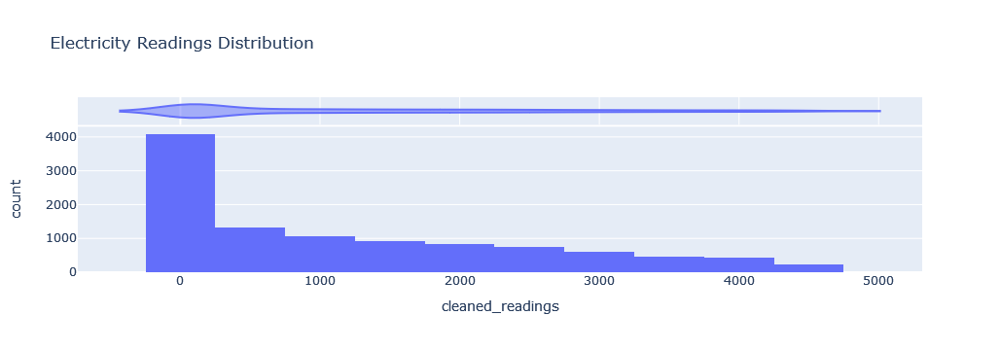

In [20]:
electricity_data = electricity_data[electricity_data["cleaned_readings"] < electricity_data["cleaned_readings"].quantile(0.90)]
fig = px.histogram(electricity_data, x="cleaned_readings", 
                   marginal="violin", 
                   nbins=20, 
                   hover_data=["houseid-meterid"], 
                   title="Electricity Readings Distribution")
fig.show()

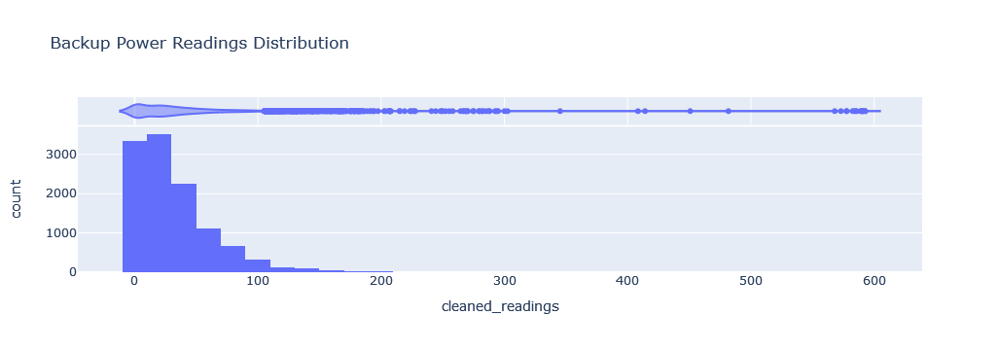

In [21]:
fig = px.histogram(backuppower_data, 
                   x="cleaned_readings", 
                   marginal="violin", 
                   nbins=40, 
                   hover_data=["houseid-meterid"], 
                   title="Backup Power Readings Distribution")
fig.show()

In [22]:
q3 = backuppower_data["cleaned_readings"].quantile(0.90)
print(f"The quantile value {q3}")

The quantile value 75.001


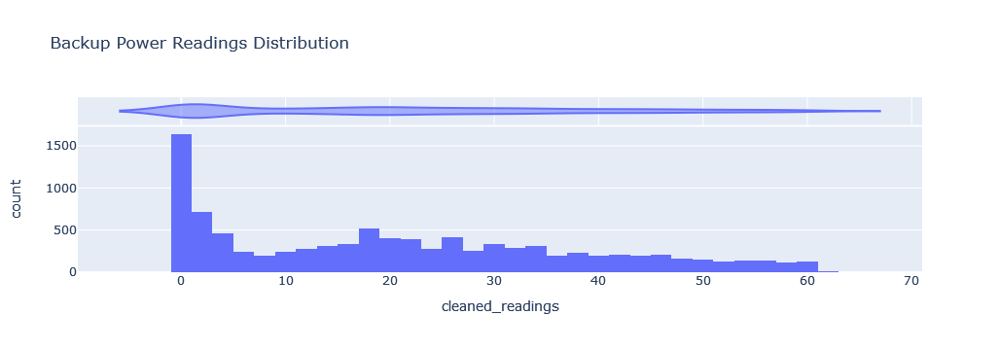

In [23]:
backuppower_data = backuppower_data[backuppower_data["cleaned_readings"] < backuppower_data["cleaned_readings"].quantile(0.85)]
fig = px.histogram(backuppower_data, 
                   x="cleaned_readings", 
                   marginal="violin", 
                   nbins=40, 
                   hover_data=["houseid-meterid"], 
                   title="Backup Power Readings Distribution")
fig.show()

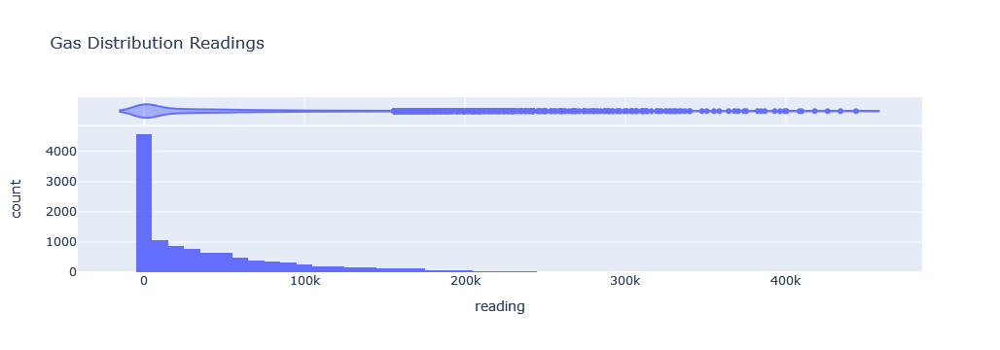

In [24]:
fig = px.histogram(gas_data, 
                   x="reading", 
                   marginal="violin", 
                   nbins=50, 
                   hover_data=["houseid-meterid"], 
                   title="Gas Distribution Readings")

fig.show()

In [25]:
q3 = gas_data["cleaned_readings"].quantile(0.85)
print(f"The quantile value {q3}")

The quantile value 95621.49999999999


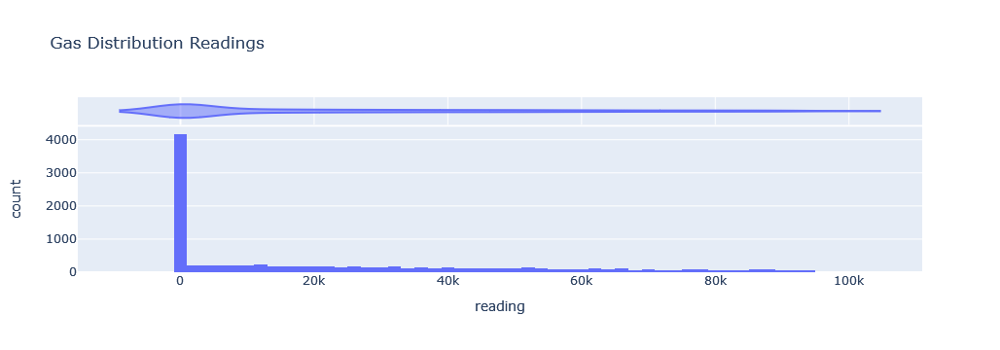

In [26]:
gas_data = gas_data[gas_data["cleaned_readings"] < gas_data["cleaned_readings"].quantile(0.85)]
fig = px.histogram(gas_data, 
                   x="reading", 
                   marginal="violin", 
                   nbins=50, 
                   hover_data=["houseid-meterid"], 
                   title="Gas Distribution Readings")

fig.show()

In [27]:
# monthly consumption pivot
# gas_pivot = gas_data.pivot_table(values="reading", index=["year", "month"], columns="paymenttermid")
# gas_pivot
# Temp all_data pivot _ table 

temp_data = pd.concat([gas_data, backuppower_data, electricity_data, water_data])
temp_all_data_pivot = temp_data.pivot_table(values="reading", index=["year", "month"], columns="paymenttermid")
temp_all_data_pivot

paymenttermid  backuppower  electricity           gas       water
year month                                                       
2019 1                 NaN    65.528097    105.527778   21.315789
     2            9.626429    88.077708   2266.678571   22.089796
     3                 NaN   119.323231   3697.880000   25.278884
     4            9.938080   154.479839   4815.955823   28.932271
     5           10.076627   191.352691   5993.635628   32.896694
     6           10.195618   233.425516   7142.136546   34.167331
     7           11.301355   283.789405   8390.157036   39.896414
     8           11.581548   344.050763   8977.387097   44.547619
     9           12.142560   402.236468   9612.319838   49.131474
     10          12.156680   468.194524  11032.101626   53.690476
     11          12.951394   521.286310  12214.390244   58.333333
     12          13.044980   592.450952  13317.758197   64.446215
2020 1           13.288571   634.774365  14292.596000   69.916335
     2           13.582231   686.511960  15880.143443   75.816733
     3           14.755339   735.616426  16981.621399   81.625498
     4           16.408606   813.656210  18462.971074   87.552000
     5           17.346024   858.402960  18035.259414   91.657258
     6           19.367875   931.678952  19090.210084   95.967480
     7           19.669370   998.751457  19978.774468  101.873984
     8           19.881772  1072.305870  21067.798283  105.016461
     9           20.455769  1155.209190  21142.305677  109.286307
     10          20.827821  1187.788245  21470.859031  111.113445
     11          21.319103  1250.446570  22639.709821  114.622318
     12          22.493435  1327.392810  23330.244344  115.283186
2021 1           22.833783  1340.367269  23021.490741  115.995475
     2           23.001096  1354.624060  24308.393519  119.388128
     3           23.690909  1457.555684  25876.832558  118.566667
     4           24.678211  1506.477778  26840.265116  122.166667
     5           26.355399  1552.580862  27900.233645  125.677885
     6           27.158476  1623.645043  27946.004762  128.333333
     7           27.495871  1687.578821  28778.629808  133.039409
     8           27.314821  1744.178044  28902.901478  137.588235
     9           28.068670  1781.023864  30451.258706  143.179104
     10          28.241452  1835.608082  32053.155000  148.361809
     11          28.830968  1923.029078  32915.223350  150.405128
     12          28.957351  1974.156495  33638.611399  153.105263
2022 1           29.393103  2033.043223  34517.424084  156.529412
     2           29.652717  2076.049614  35821.074074  160.661202
     3           30.055491  2085.123650  36513.945946  165.668508
     4           30.161802  2118.294082  36878.878453  171.066667
     5           30.637337  2142.552775  38070.379888  172.040462
     6           31.001905  2139.401196  38020.591954  173.341317
     7           31.435090  2237.129066  37748.485030  172.987342
     8           31.212761  2301.563539  37719.037037  177.158228
     9           31.035776  2380.115257  38030.037975  176.101351
     10          31.075506  2398.741471  38832.192308  178.548611
     11          31.686711  2409.624233  39825.084416  181.750000
     12          31.925298  2336.356209  40200.715232  179.560606

In [28]:
# fig = ff.create_distplot(hist_data, group_labels, colors=colors,
#                          bin_size=.2, show_rug=False)

# fig = px.histogram(temp_all_data_pivot, 
#                    x="paymenttermid", 
#                    color="year", 
#                    barmode="group", 
#                    height=500)
# fig.show()

# fig = px.bar(temp_all_data_pivot, x="paymenttermid", color="year",)
# fig.show()
# temp_all_data_pivot.plot.bar(figsize=(10,7))

In [29]:
# Add columns that account for differenc

water_data["quarter"] = water_data.index.quarter
backuppower_data["quarter"] = backuppower_data.index.quarter
gas_data["quarter"] = gas_data.index.quarter
electricity_data["quarter"] = electricity_data.index.quarter

In [30]:
water_data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 10126 entries, 2019-02-01 to 2022-12-01
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   id                10126 non-null  int64  
 1   paymenttermid     10126 non-null  object 
 2   houseid           10126 non-null  int64  
 3   houseid-meterid   10126 non-null  object 
 4   reading           10126 non-null  float64
 5   month             10126 non-null  int64  
 6   year              10126 non-null  int64  
 7   cleaned_readings  10126 non-null  float64
 8   quarter           10126 non-null  int64  
dtypes: float64(2), int64(5), object(2)
memory usage: 791.1+ KB


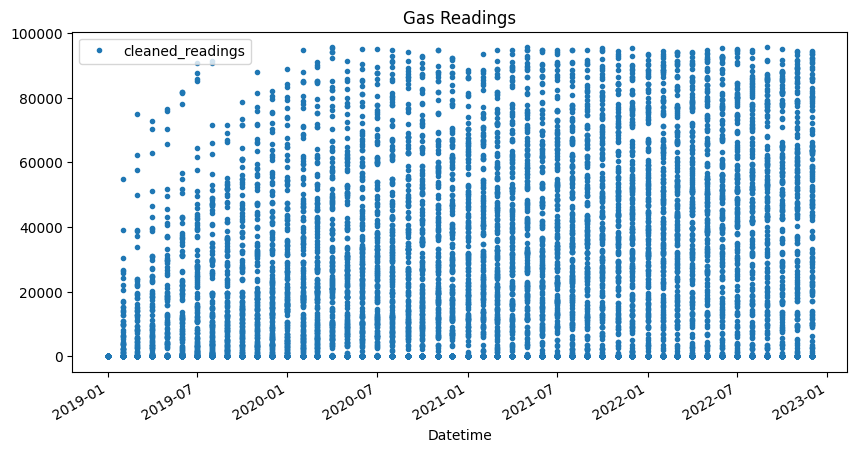

In [31]:
gas_data.plot(
    y='cleaned_readings',
    style='.',
        figsize=(10, 5),
        color=color_pal[0],
        title='Gas Readings')
plt.show()

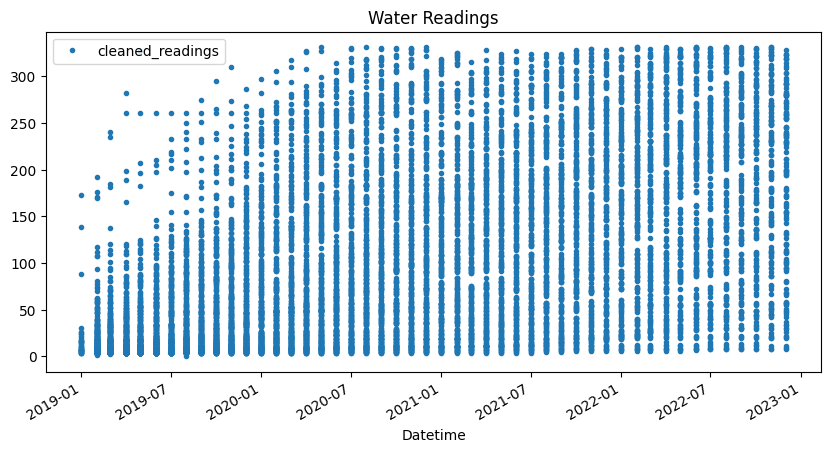

In [32]:
water_data.plot(
    y='cleaned_readings',
    style='.',
        figsize=(10, 5),
        color=color_pal[0],
        title='Water Readings')
plt.show()

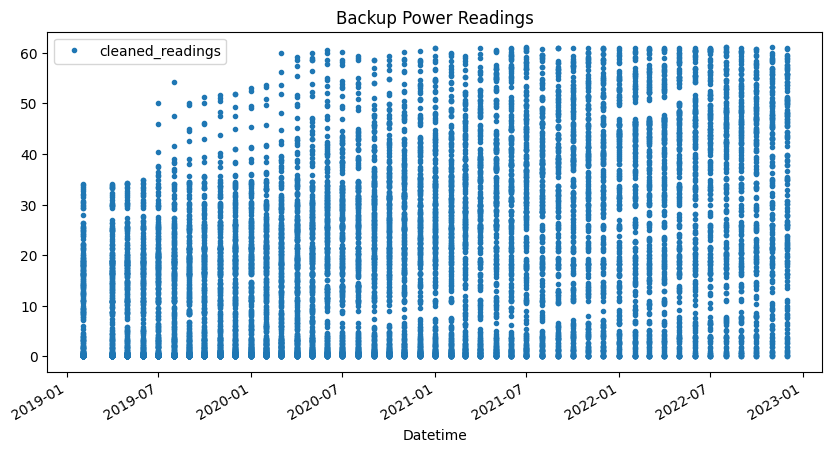

In [33]:
backuppower_data.plot(
    y='cleaned_readings',
    style='.',
        figsize=(10, 5),
        color=color_pal[0],
        title='Backup Power Readings')
plt.show()

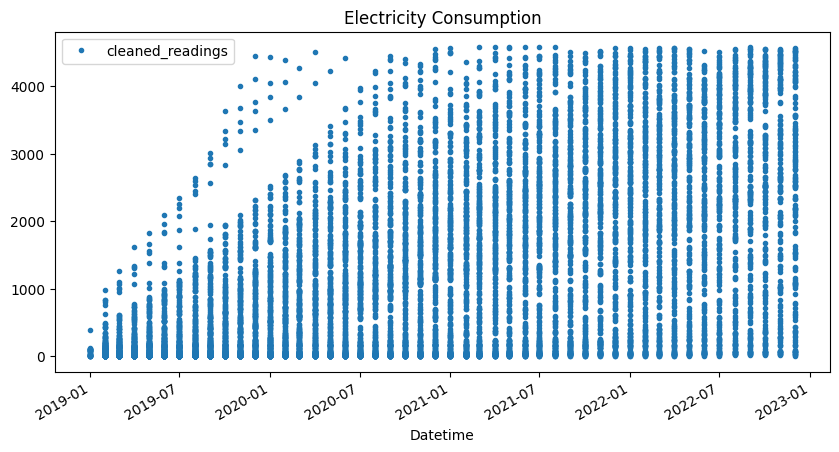

In [34]:
electricity_data.plot(
    y='cleaned_readings',
    style='.',
        figsize=(10, 5),
        color=color_pal[0],
        title='Electricity Consumption')
plt.show()

### Train Test Split

In [35]:
# dropping for the reading columns

gas_data = gas_data.drop(columns=["reading", "id"])
water_data = water_data.drop(columns=["reading", "id"])
electricity_data = electricity_data.drop(columns=["reading", "id"])
backuppower_data = backuppower_data.drop(columns=["reading", "id"])

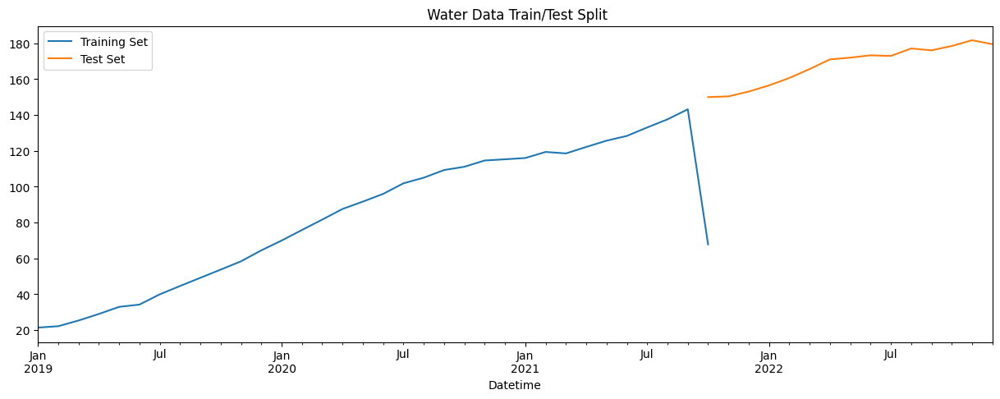

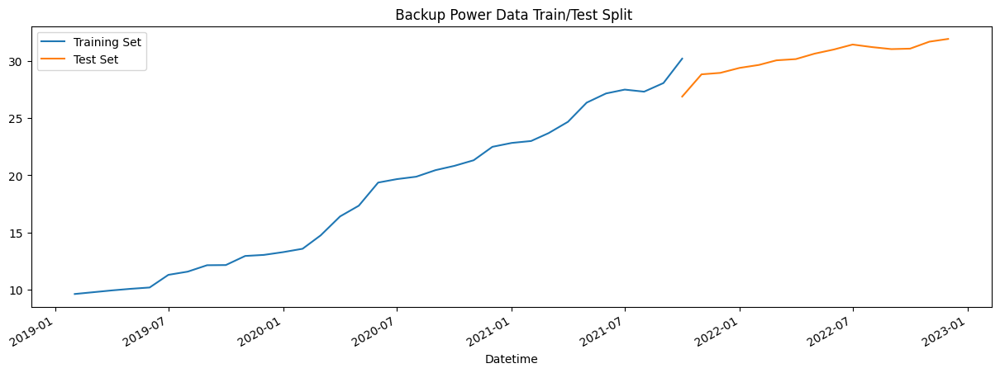

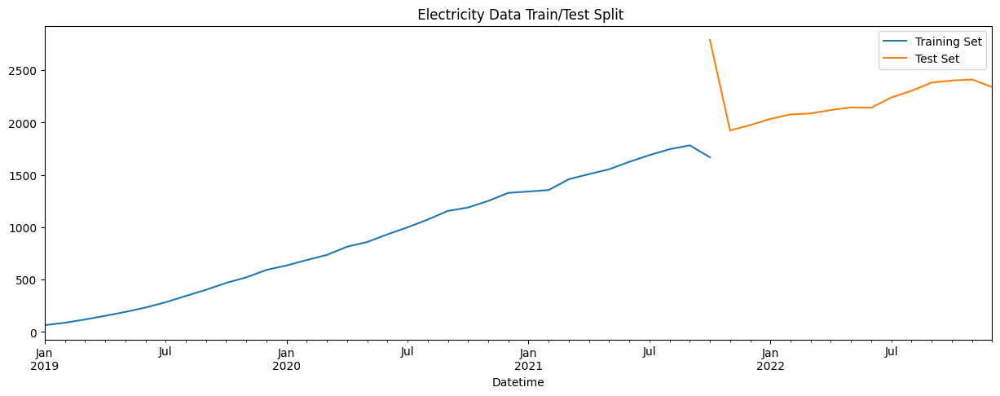

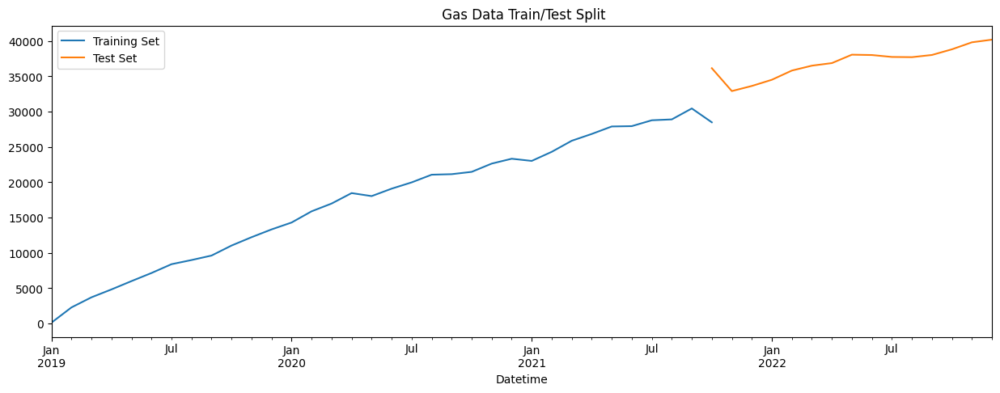

In [74]:
from sklearn.model_selection import TimeSeriesSplit

tss = TimeSeriesSplit(n_splits=3)

# train-test split for the water data
X_water = water_data.drop(labels=['cleaned_readings'], axis=1)
y_water = water_data['cleaned_readings']

for train_index, test_index in tss.split(X_water):
    X_water_train, X_water_test = X_water.iloc[train_index,:], X_water.iloc[test_index,:]
    y_water_train, y_water_test = y_water.iloc[train_index], y_water.iloc[test_index]

fig, ax = plt.subplots(figsize=(15, 5))
y_water_train.groupby('Datetime').mean().plot(ax=ax, label="Training Set", title=" Water Data Train/Test Split")
y_water_test.groupby('Datetime').mean().plot(ax=ax, label="Test Set")
                                              
ax.legend(['Training Set', 'Test Set'])
plt.show()

# train-test split for backup power data
X_backuppower = backuppower_data.drop(labels=['cleaned_readings'], axis=1)
y_backuppower = backuppower_data['cleaned_readings']

for train_index, test_index in tss.split(X_backuppower):
    X_backuppower_train, X_backuppower_test = X_backuppower.iloc[train_index,:], X_backuppower.iloc[test_index,:]
    y_backuppower_train, y_backuppower_test = y_backuppower.iloc[train_index], y_backuppower.iloc[test_index]

fig, ax = plt.subplots(figsize=(15, 5))
y_backuppower_train.groupby('Datetime').mean().plot(ax=ax, label="Training Set", title=" Backup Power Data Train/Test Split")
y_backuppower_test.groupby('Datetime').mean().plot(ax=ax, label="Test Set")
                                              
ax.legend(['Training Set', 'Test Set'])
plt.show()

X_electricity = electricity_data.drop(labels=['cleaned_readings'], axis=1)
y_electricity = electricity_data['cleaned_readings']

for train_index, test_index in tss.split(X_electricity):
    X_electricity_train, X_electricity_test = X_electricity.iloc[train_index,:], X_electricity.iloc[test_index,:]
    y_electricity_train, y_electricity_test = y_electricity.iloc[train_index], y_electricity.iloc[test_index]

fig, ax = plt.subplots(figsize=(15, 5))
y_electricity_train.groupby('Datetime').mean().plot(ax=ax, label="Training Set", title=" Electricity Data Train/Test Split")
y_electricity_test.groupby('Datetime').mean().plot(ax=ax, label="Test Set")
                                              
ax.legend(['Training Set', 'Test Set'])
plt.show()

X_gas = gas_data.drop(labels=['cleaned_readings'], axis=1)
y_gas = gas_data['cleaned_readings']

for train_index, test_index in tss.split(X_gas):
    X_gas_train, X_gas_test = X_gas.iloc[train_index,:], X_gas.iloc[test_index,:]
    y_gas_train, y_gas_test = y_gas.iloc[train_index], y_gas.iloc[test_index]

fig, ax = plt.subplots(figsize=(15, 5))
y_gas_train.groupby('Datetime').mean().plot(ax=ax, label="Training Set", title=" Gas Data Train/Test Split")
y_gas_test.groupby('Datetime').mean().plot(ax=ax, label="Test Set")
                                              
ax.legend(['Training Set', 'Test Set'])
plt.show()

## Predictive Modelling

In [75]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.compose import make_column_selector as selector
from sklearn.model_selection import cross_validate, TimeSeriesSplit
from sklearn.linear_model import RidgeCV
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import RandomizedSearchCV

In [99]:
water_data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 10126 entries, 2019-02-01 to 2022-12-01
Data columns (total 7 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   paymenttermid     10126 non-null  object 
 1   houseid           10126 non-null  int64  
 2   houseid-meterid   10126 non-null  object 
 3   month             10126 non-null  int64  
 4   year              10126 non-null  int64  
 5   cleaned_readings  10126 non-null  float64
 6   quarter           10126 non-null  int64  
dtypes: float64(1), int64(4), object(2)
memory usage: 632.9+ KB


In [76]:
# numeric_preprocessor = ColumnTransformer([
#     ('scaling', StandardScaler(), ['quantity',])
# ])

categorical_preprocessor = ColumnTransformer([
    ('encoding', OneHotEncoder(handle_unknown="ignore"), ['paymenttermid', 'houseid-meterid'])
])

In [77]:
linear_model = Pipeline([
    ("categorical_preprocessor", categorical_preprocessor),
    ("regressor", RidgeCV())
])

linear_model

Pipeline(steps=[('categorical_preprocessor',
                 ColumnTransformer(transformers=[('encoding',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['paymenttermid',
                                                   'houseid-meterid'])])),
                ('regressor', RidgeCV())])

In [78]:
hgbt = Pipeline([
    ("categorical_preprocessor", categorical_preprocessor),
    ("regressor", GradientBoostingRegressor())
])

hgbt

Pipeline(steps=[('categorical_preprocessor',
                 ColumnTransformer(transformers=[('encoding',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['paymenttermid',
                                                   'houseid-meterid'])])),
                ('regressor', GradientBoostingRegressor())])

## HyperParameter Tuning

### Ridge Cross Validation

In [79]:
param_distributions = {'regressor__alphas': np.logspace(-5, 5, 15),
                      'regressor__fit_intercept': [True, False],
                      }

random_search = RandomizedSearchCV(
    linear_model, 
    param_distributions=param_distributions, 
    n_iter=20, 
    scoring='neg_mean_absolute_error', 
    n_jobs=-1, cv=TimeSeriesSplit(n_splits=4), random_state=42)

In [80]:
X_water_train.head()

,paymenttermid,houseid,houseid-meterid,month,year,quarter
Datetime,,,,,,
2019-02-01,water,211,211M197,2,2019,1
2019-02-01,water,215,215M201,2,2019,1
2019-02-01,water,219,219M205,2,2019,1
2019-02-01,water,223,223M209,2,2019,1
2019-02-01,water,227,227M213,2,2019,1


In [81]:
random_search.fit(X_water_train, y_water_train)

# Print the best parameters and the best score
print("Best parameters: ", random_search.best_params_)
print("Best MAE: ", -random_search.best_score_)

Best parameters:  {'regressor__fit_intercept': False, 'regressor__alphas': 1e-05}
Best MAE:  48.367536972755076


In [82]:
mae = random_search.score(X_water_test, y_water_test)
print(f"The test mean absolue error of the best model is"
      f": {-mae:.3f}")

The test mean absolue error of the best model is: 61.996


#### HistBoostingGradientRegressor

In [83]:
from scipy.stats import loguniform 

class loguniform_int: 
    """Integer valued version of the log-uniform distribution"""
    def __init__(self, a, b): 
        self._distribution = loguniform(a, b)
        
    def rvs(self, *args, **kwargs): 
        """Random variable sample"""
        return self._distribution.rvs(*args, **kwargs).astype(int)

In [84]:
%%time

param_distributions = {
    # 'regressor__l2_regularization': loguniform(1e-6, 1e3),
    'regressor__learning_rate': loguniform(0.001, 10),
    'regressor__max_leaf_nodes': loguniform_int(2, 256),
    'regressor__min_samples_leaf': loguniform_int(1, 100),
    # 'regressor__max_bins': loguniform_int(2, 255),
}

model_random_search = RandomizedSearchCV(
    hgbt, param_distributions=param_distributions, 
    n_iter=10, cv=TimeSeriesSplit(n_splits=4), 
    verbose=1, random_state=42, 
    scoring='neg_mean_absolute_error'
)
model_random_search.fit(X_water_train, y_water_train)

Fitting 4 folds for each of 10 candidates, totalling 40 fits
CPU times: total: 7.09 s
Wall time: 8.23 s


RandomizedSearchCV(cv=TimeSeriesSplit(gap=0, max_train_size=None, n_splits=4, test_size=None),
                   estimator=Pipeline(steps=[('categorical_preprocessor',
                                              ColumnTransformer(transformers=[('encoding',
                                                                               OneHotEncoder(handle_unknown='ignore'),
                                                                               ['paymenttermid',
                                                                                'houseid-meterid'])])),
                                             ('regressor',
                                              GradientBoostingRegressor())]),
                   param_distributions={'regressor__learning_rate': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x000001764A617C40>,
                                        'regressor__max_leaf_nodes': <__main__.loguniform_int object at 0x000001764AC3D120>,
                                        'regressor__min_samples_leaf': <__main__.loguniform_int object at 0x000001764A615CF0>},
                   random_state=42, scoring='neg_mean_absolute_error',
                   verbose=1)

In [85]:
mae = model_random_search.score(X_water_test, y_water_test)
print(f"The test mean absolue error of the best model is"
      f": {-mae:.3f}")

The test mean absolue error of the best model is: 102.581


In [86]:
from pprint import pprint

print('The best parameters are:')
pprint(model_random_search.best_params_)

The best parameters are:
{'regressor__learning_rate': 0.24810409748678097,
 'regressor__max_leaf_nodes': 4,
 'regressor__min_samples_leaf': 2}


## Model Cross Validation
### Water

In [88]:
from sklearn.model_selection import TimeSeriesSplit, cross_validate

lm_model = RidgeCV(fit_intercept=True)

tscv = TimeSeriesSplit(n_splits=4)
lm_cv_results = cross_validate(
    linear_model, X_water_train, y_water_train, cv=tscv, 
    scoring="neg_mean_absolute_error", 
    return_estimator=True, 
    return_train_score=True, 
    error_score='raise',
    n_jobs=-1)

In [90]:
gb_model = Pipeline([
    ("categorical_preprocessor", categorical_preprocessor),
    ("regressor", GradientBoostingRegressor( 
            learning_rate=0.24810, 
            max_leaf_nodes=4, 
            min_samples_leaf=2)
        )
])

hgbr_cv_results = cross_validate(
    gb_model, X_water_train, y_water_train, cv=tscv,
    scoring = "neg_mean_absolute_error",
    return_estimator=True,
    return_train_score=True,
    n_jobs=-1
)

In [91]:
lm_train_errors = -lm_cv_results["train_score"]
print(f"Linear model - MAE on train sets:\t",
      f"{lm_train_errors.mean():.3f} +/- {lm_train_errors.std():.3f} Watts")
lm_test_errors = -lm_cv_results["test_score"]
print(f"Linear model - MAE on test sets:\t",
      f"{lm_test_errors.mean():.3f} +/- {lm_test_errors.std():.3f} Watts")

hgbr_train_errors = -hgbr_cv_results["train_score"]
print(f"Histogram GBDT - MAE on train sets:\t",
      f"{hgbr_train_errors.mean():.3f} +/- {hgbr_train_errors.std():.3f} Watts")
hgbr_test_errors = -hgbr_cv_results["test_score"]
print(f"Histogram GBDT - MAE on test sets:\t",
      f"{hgbr_test_errors.mean():.3f} +/- {hgbr_test_errors.std():.3f} Watts")


Linear model - MAE on train sets:	 20.838 +/- 10.216 Watts
Linear model - MAE on test sets:	 53.066 +/- 16.926 Watts
Histogram GBDT - MAE on train sets:	 30.483 +/- 11.985 Watts
Histogram GBDT - MAE on test sets:	 60.951 +/- 17.533 Watts


In [92]:
wife_scores = {
    "GB-test_score": -hgbr_cv_results['test_score'],
    "GB-train_score" : -hgbr_cv_results['train_score'],
    "LN-test_score" : -lm_cv_results['test_score'],
    "LN-train_score" : -lm_cv_results['train_score'],
}

wife_scores = pd.DataFrame(scores)
wife_scores

,GB-test_score,GB-train_score,LN-test_score,LN-train_score
0,34.466182,14.801640,28.192373,7.692231
1,56.134335,24.544637,47.402167,15.380491
2,73.856843,35.827309,64.532502,25.565367
3,79.345867,46.757398,72.135918,34.712986


### Gas

In [93]:
# linear_model

# hgbt
lm_cv_results = cross_validate(
    linear_model, X_gas_train, y_gas_train, cv=tscv, 
    scoring="neg_mean_absolute_error", 
    return_estimator=True, 
    return_train_score=True, 
    error_score='raise',
    n_jobs=-1)

In [94]:
hgbr_cv_results = cross_validate(
    gb_model, X_gas_train, y_gas_train, cv=tscv,
    scoring = "neg_mean_absolute_error",
    return_estimator=True,
    return_train_score=True,
    n_jobs=-1
)

In [96]:
lm_train_errors = -lm_cv_results["train_score"]
print(f"Linear model - MAE on train sets:\t",
      f"{lm_train_errors.mean():.3f} +/- {lm_train_errors.std():.3f} ")
lm_test_errors = -lm_cv_results["test_score"]
print(f"Linear model - MAE on test sets:\t",
      f"{lm_test_errors.mean():.3f} +/- {lm_test_errors.std():.3f} ")

hgbr_train_errors = -hgbr_cv_results["train_score"]
print(f"Histogram GBDT - MAE on train sets:\t",
      f"{hgbr_train_errors.mean():.3f} +/- {hgbr_train_errors.std():.3f} ")
hgbr_test_errors = -hgbr_cv_results["test_score"]
print(f"Histogram GBDT - MAE on test sets:\t",
      f"{hgbr_test_errors.mean():.3f} +/- {hgbr_test_errors.std():.3f} ")


Linear model - MAE on train sets:	 5654.858 +/- 2217.532 
Linear model - MAE on test sets:	 12967.041 +/- 3623.214 
Histogram GBDT - MAE on train sets:	 8186.757 +/- 3332.829 
Histogram GBDT - MAE on test sets:	 15920.415 +/- 4670.671 


In [97]:
gas_scores = {
    "GB-test_score": -hgbr_cv_results['test_score'],
    "GB-train_score" : -hgbr_cv_results['train_score'],
    "LN-test_score" : -lm_cv_results['test_score'],
    "LN-train_score" : -lm_cv_results['train_score'],
}

gas_scores = pd.DataFrame(scores)
gas_scores

,GB-test_score,GB-train_score,LN-test_score,LN-train_score
0,34.466182,14.801640,28.192373,7.692231
1,56.134335,24.544637,47.402167,15.380491
2,73.856843,35.827309,64.532502,25.565367
3,79.345867,46.757398,72.135918,34.712986


In [98]:
class Num: 
    def __init__(self, value):
        self.value = value
        
    def __add__(self, other):
        return self.value - other.value
    
x = Num(5)
y = Num(10)
print(x+y)

-5
